In [1]:
!date

Mon May 30 12:48:52 PDT 2022


# Expression MHC1-associated genes 
## - comparison between control and experiment datasets
Unfiltered data obtained from using kb with multimapping function. Ref genome includes WRE.

___

In [2]:
%config InlineBackend.figure_format = 'retina'
%load_ext blackcellmagic

In [3]:
import sys
import anndata
# import scvi

import scanpy as sc
import numpy as np
from scipy import stats

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Custom violinplot code
from plotting_funcs import violinplot

import pandas as pd

sc.set_figure_params(figsize=(6, 6), frameon=False)
sc.settings.n_jobs=2

In [4]:
# set random seed
np.random.seed(926)

In [5]:
def nd(arr):
    """
    Funciton to transform numpy matrix to nd array.
    """
    return np.asarray(arr).reshape(-1)

___

# Load AnnData object

In [6]:
adata = anndata.read_h5ad("../../finchseq_data/all_celltype.h5ad")
adata

AnnData object with n_obs × n_vars = 35804 × 22151
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden', 'celltype', 'connectivity'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'celltype_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

Define masks to separate control and experiment datasets:

In [7]:
control_mask = np.logical_or(adata.obs["batch"]=="control1", adata.obs["batch"]=="control2")
experiment_mask = np.logical_or(adata.obs["batch"]=="experiment1", adata.obs["batch"]=="experiment2")

Add new obs column to separate between control and experiment in general, without separating between batches:

In [8]:
adata.obs["batch_g"] = ""

adata.obs.loc[control_mask, "batch_g"] = "control"
adata.obs.loc[experiment_mask, "batch_g"] = "experiment"

adata.obs

,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype,connectivity,batch_g
barcode,,,,,,,,,
AAACCCAAGCACTGGA-0,zebrafinch,control1,483.000000,0,483.000000,13,mural cells 2,0,control
AAACCCAAGCGTCAAG-0,zebrafinch,control1,946.000061,0,946.000061,3,microglia 1,1,control
AAACCCAAGGTCACAG-0,zebrafinch,control1,1068.000000,0,1068.000000,1,GABAergic neurons 1,2,control
AAACCCAAGTCATTGC-0,zebrafinch,control1,1407.000000,0,1407.000000,10,astrocytes 2,3,control
AAACCCAAGTGCTACT-0,zebrafinch,control1,1060.000000,0,1060.000000,1,GABAergic neurons 1,2,control
...,...,...,...,...,...,...,...,...,...
TTTGTTGTCAACTCTT-3,zebrafinch,experiment2,791.999939,3,791.999939,0,glutamatergic neurons 1,undefined 1,experiment
TTTGTTGTCGATCCAA-3,zebrafinch,experiment2,4345.000000,3,4345.000000,2,migrating neuroblasts,9,experiment
TTTGTTGTCTAGATCG-3,zebrafinch,experiment2,1352.000000,3,1352.000000,6,mural / vascular endothelial cells 1,6,experiment


___

# Genes related to MHC Class 1
Regulation of CNS synapses by neuronal MHC class I https://pubmed.ncbi.nlm.nih.gov/17420446/

In [9]:
# MHCI associated genes
mhc_genes = [
    "_ENSTGUG00000017273.2",
    "_ENSTGUG00000028417.1",
    "_ENSTGUG00000004607.2",
    "_ENSTGUG00000010325.2",
    "_ENSTGUG00000024320.1",
#     "_ENSTGUG00000010847.2",
    "CD3E_ENSTGUG00000022317.1",
    "IFI30_ENSTGUG00000000388.2",
    "FGL2_ENSTGUG00000002746.2",
    "TAF7_ENSTGUG00000006593.2",
    "CALR_ENSTGUG00000014982.2",
    "_ENSTGUG00000015337.2",
    "CTSH_ENSTGUG00000009976.2",
    "PDIA3_ENSTGUG00000010220.2",
#     "CD8A_ENSTGUG00000010841.2",
    "IDE_ENSTGUG00000008951.2",
    "ATP5F1A_ENSTGUG00000001582.2",
    "ATP5F1B_ENSTGUG00000015620.2",
    ## Rescue signal canidate CX3C and its receptor
    "_ENSTGUG00000024320.1",         # C-X3-C motif chemokine ligand 1
    "CX3CR1_ENSTGUG00000018365.2",   # C-X3-C motif chemokine receptor 1
]
mhc_gene_names = [
    "MHC1 F10 alpha chain-like 1",
    "MHC1 F10 alpha chain like 2",
    "Beta-2-microglobulin",
    "CCL3L3",
    "CX3CL1",
#     "MHC1 protein binding like",
    "CD3E",
    "IFI30",
    "Fibrinogen like 2",
    "TAF7",
    "Calreticulin",
    "Antigen peptide transporter like",
    "Cathepsin H",
    "PDIA3",
#     "CD8A",
    "IDE",
    "ATP5F1A",
    "ATP5F1B",
    ## Receptor for rescue signal canidate CX3C
    "CX3C",
    "CX3CR1" 
]

#### Notes on MHC1 associated genes listed above:
novel gene (Zebra finch Gene)
ENSTGUG00000017273 RRCB01000109.1:1545781-1566436:1
Class I histocompatibility antigen, F10 alpha chain-like [Source:NCBI gene;Acc:115493126]
LOC100231469 (NCBI gene (formerly Entrezgene) record; description: class I histocompatibility antigen, F10 alpha chain-like,) is an external reference matched to Gene ENSTGUG00000017273

novel gene (Zebra finch Gene)
ENSTGUG00000028417 RRCB01000109.1:254090-279387:1
Class I histocompatibility antigen, F10 alpha chain-like [Source:NCBI gene;Acc:115493083]
LOC115493083 (NCBI gene (formerly Entrezgene) record; description: class I histocompatibility antigen, F10 alpha chain-like,) is an external reference matched to Gene ENSTGUG00000028417

novel gene (Zebra finch Gene)
ENSTGUG00000004607 10:4098707-4102774:-1
GO:0042612 (GO record; description: MHC class I protein complex,) is an external reference matched to Transcript ENSTGUT00000004794  
-- UniProtKB match:Beta-2-microglobulin

CD3E (Zebra finch Gene)
ENSTGUG00000022317 24:6524361-6530450:-1
CD3e molecule [Source:NCBI gene;Acc:115498349].

IFI30 (Zebra finch Gene)
ENSTGUG00000000388 28:3544686-3547884:1
IFI30 lysosomal thiol reductase [Source:HGNC Symbol;Acc:HGNC:5398]
GO:0042590 (GO record; description: antigen processing and presentation of exogenous peptide antigen via MHC class I,) is an external reference matched to Transcript ENSTGUT00000000403

TAF7 (Zebra finch Gene)
ENSTGUG00000006593 4A:18660736-18666314:1
TATA-box binding protein associated factor 7 like [Source:NCBI gene;Acc:100228159]
GO:0045344 (GO record; description: negative regulation of MHC class I biosynthetic process,) is an external reference matched to Transcript ENSTGUT00000006864

CALR (Zebra finch Gene)
ENSTGUG00000014982 30:3757974-3761873:1
Calreticulin [Source:NCBI gene;Acc:100190479]
GO:0042824 (GO record; description: MHC class I peptide loading complex,) is an external reference matched to Transcript ENSTGUT00000015593

novel gene (Zebra finch Gene)
ENSTGUG00000015337 RRCB01000090.1:2677018-2687645:1
Antigen peptide transporter 1-like [Source:NCBI gene;Acc:105760759]
GO:0002479 (GO record; description: antigen processing and presentation of exogenous peptide antigen via MHC class I, TAP-dependent,) is an external reference matched to Transcript ENSTGUT00000015946

CTSH (Zebra finch Gene)
ENSTGUG00000009976 10:21449104-21547116:-1
Cathepsin H [Source:HGNC Symbol;Acc:HGNC:2535]
GO:0030108 (GO record; description: HLA-A specific activating MHC class I receptor activity,) is an external reference matched to Transcript ENSTGUT00000010401

PDIA3 (Zebra finch Gene)
ENSTGUG00000010220 10:21775416-21783116:-1
Protein disulfide isomerase family A member 3 [Source:NCBI gene;Acc:101234078]
GO:0042824 (GO record; description: MHC class I peptide loading complex,) is an external reference matched to Transcript ENSTGUT00000010675

IDE (Zebra finch Gene)
ENSTGUG00000008951 6:19632451-19686491:1
Insulin degrading enzyme [Source:NCBI gene;Acc:100232369]
GO:0019885 (GO record; description: antigen processing and presentation of endogenous peptide antigen via MHC class I,) is an external reference matched to Transcript ENSTGUT00000036510

ATP5F1A (Zebra finch Gene)
ENSTGUG00000001582 Z:40984572-41030045:1
ATP synthase F1 subunit alpha [Source:NCBI gene;Acc:751975]
GO:0042288 (GO record; description: MHC class I protein binding,) is an external reference matched to Transcript ENSTGUT00000032148

ATP5F1B (Zebra finch Gene)
ENSTGUG00000015620 29:1469203-1601380:-1
ATP synthase F1 subunit beta [Source:NCBI gene;Acc:100221153]
GO:0042288 (GO record; description: MHC class I protein binding,) is an external reference matched to Transcript ENSTGUT00000016243

### Heatmaps

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1229: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'batch_g' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'batch_g' as categorical
... storing 'batch_g' as categorical


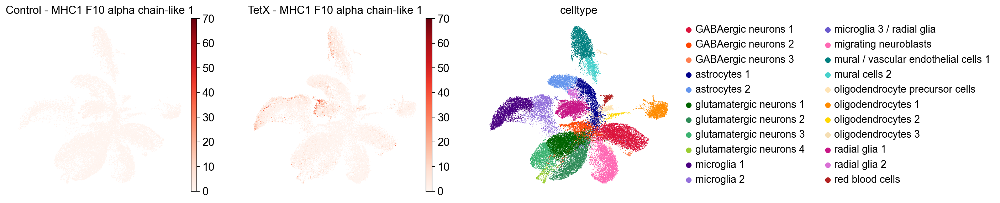

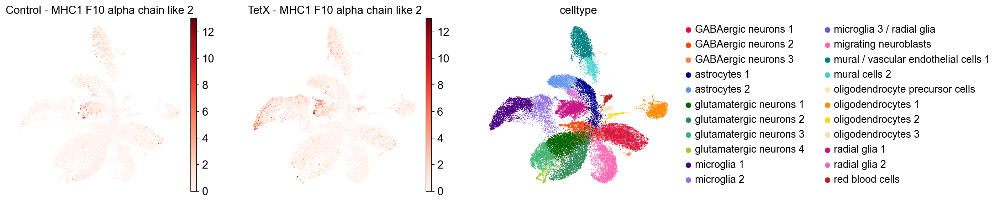

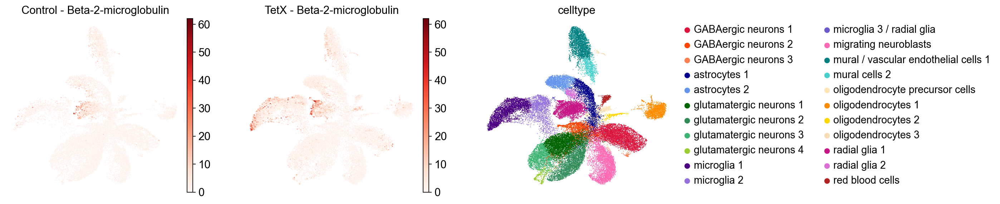

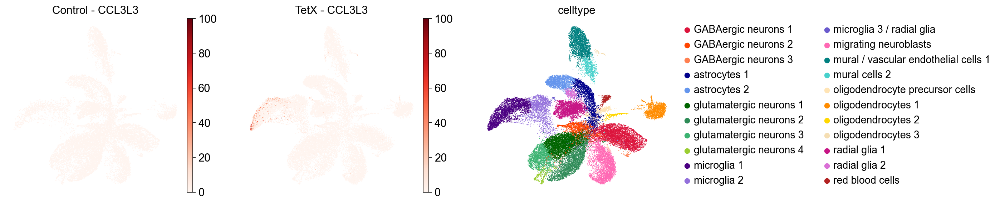

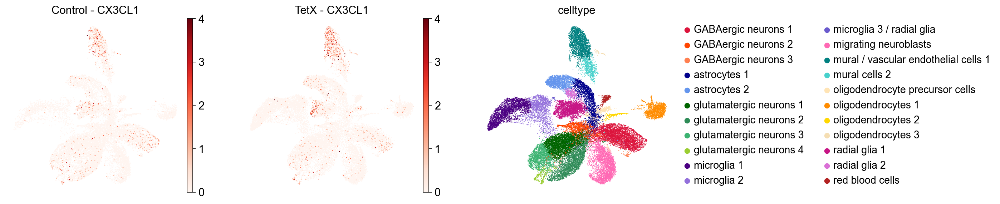

...

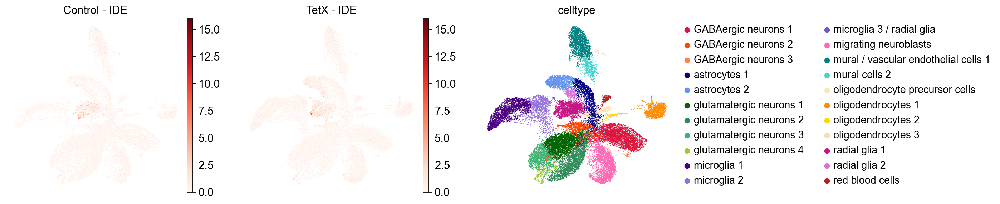

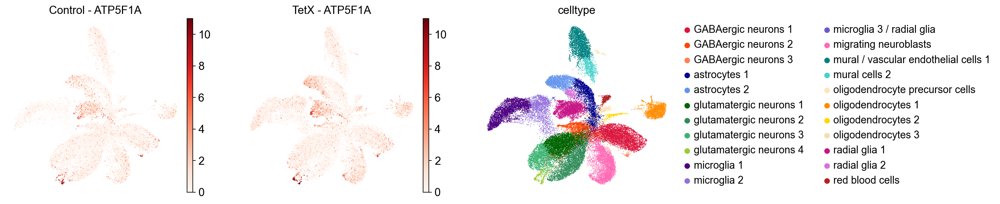

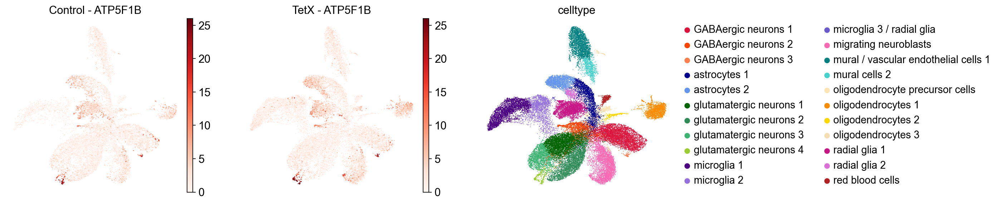

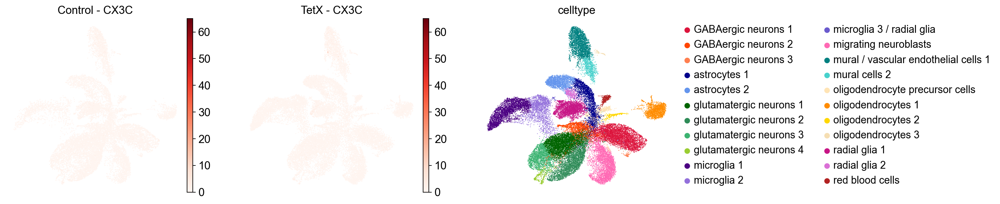

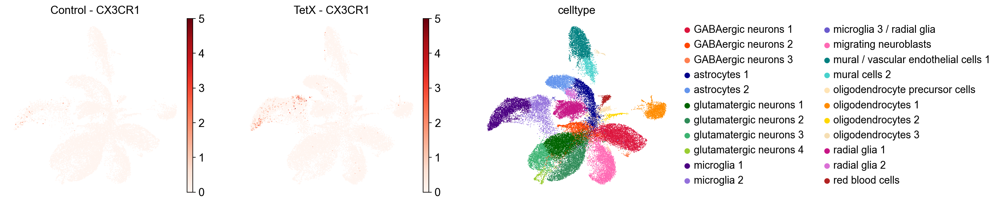

In [10]:
vmin = 0
vmax = [70, 13, 62, 100, 4, 15, 35, 27, 85, 11, 25, 8, 8, 16, 11, 26, 65, 5, 4]
size = 5

for i, gene in enumerate(mhc_genes):
    fig, axs = plt.subplots(figsize=(15,4), ncols=3)

    condition = ["control", "experiment"]
    color_map = "Reds"

    sc.pl.umap(adata[np.char.startswith(nd(adata.obs.batch.values).astype(str), condition[0])], size=size, color=gene, title="Control - {}".format(mhc_gene_names[i], condition[0]), vmax=vmax[i], vmin=vmin, color_map=color_map, use_raw=True, show=False, ax=axs[0])
    sc.pl.umap(adata[np.char.startswith(nd(adata.obs.batch.values).astype(str), condition[1])], size=size, color=gene, title="TetX - {}".format(mhc_gene_names[i], condition[1]), vmax=vmax[i], vmin=vmin, color_map=color_map, use_raw=True, show=False, ax=axs[1])
    sc.pl.umap(adata, color="celltype", show=False, ax=axs[2])

___

# Violin plots

Split experiment and control data into separate AnnData objects for plotting:

In [11]:
adata_exp = adata[adata.obs.batch_g=="experiment"]
adata_ctrl = adata[adata.obs.batch_g=="control"]

___

# MHC1-associated genes

Individual cluster analysis (obs column: celltype).


/home/lauraluebbert/projects/finchseq/Torok-data-analysis/plotting_funcs.py:72: RuntimeWarning: divide by zero encountered in float_scalars
  fold_change = np.mean(cell_array) / np.mean(x_ctrl[index])
/home/lauraluebbert/projects/finchseq/Torok-data-analysis/plotting_funcs.py:80: RuntimeWarning: invalid value encountered in float_scalars
  fold_change = np.mean(x_ctrl[index]) / np.mean(cell_array)
/home/lauraluebbert/projects/finchseq/Torok-data-analysis/plotting_funcs.py:80: RuntimeWarning: divide by zero encountered in float_scalars
  fold_change = np.mean(x_ctrl[index]) / np.mean(cell_array)


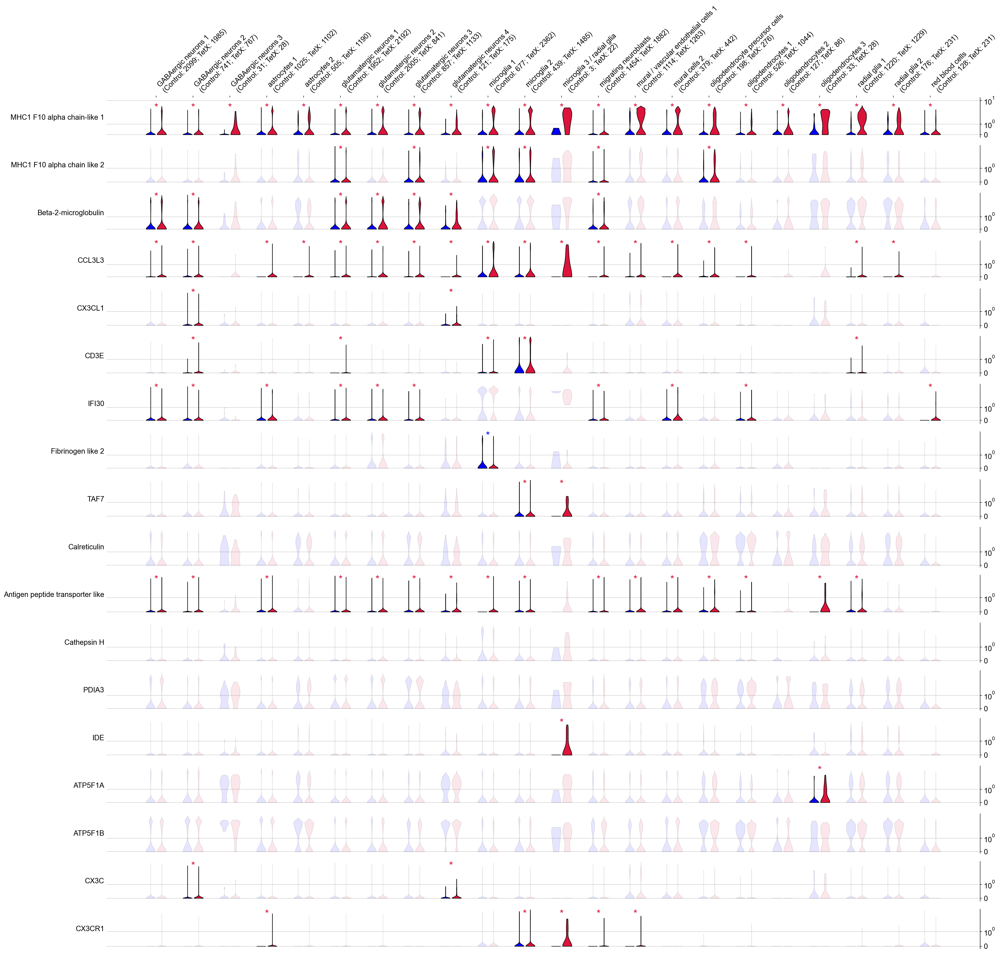

In [12]:
genes = mhc_genes
labels = mhc_gene_names
celltypes = np.sort(adata.obs.celltype.values.unique())

violinplot(
    adata_exp,
    adata_ctrl,
    genes,
    labels,
    celltypes,
    "MHC1-associated_genes",
    alpha=0.05, 
    fold_change_min=2, 
    figsize=(30,30)
)

____

# Final plot

In [17]:
markers2 = [
    ## Circuit communication
    # MHC1
    "_ENSTGUG00000017273.2",
    "_ENSTGUG00000028417.1",
    "_ENSTGUG00000004607.2",
    # Receptor for rescue signal canidate CX3C
    "_ENSTGUG00000024320.1",          # C-X3-C motif chemokine ligand 1
    "CX3CR1_ENSTGUG00000018365.2",    # C-X3-C motif chemokine receptor 1
     # MHC1 ligands
#     "_ENSTGUG00000010847.2",
    "CD3E_ENSTGUG00000022317.1",
    "IFI30_ENSTGUG00000000388.2",
#     "FGL2_ENSTGUG00000002746.2",
#     "TAF7_ENSTGUG00000006593.2",
#     "CALR_ENSTGUG00000014982.2",
    "_ENSTGUG00000015337.2",
#     "CTSH_ENSTGUG00000009976.2",
#     "PDIA3_ENSTGUG00000010220.2",
#     "CD8A_ENSTGUG00000010841.2",
#     "IDE_ENSTGUG00000008951.2",
#     "ATP5F1A_ENSTGUG00000001582.2",
#     "ATP5F1B_ENSTGUG00000015620.2",
    
    ## Microglia activation
    # Pro-inflammatory genes found in DE gene analysis
    "_ENSTGUG00000010325.2",
    "IFI6_ENSTGUG00000021692.1",  
    # From Masuda et al JPS 2015
    "IRF1_ENSTGUG00000001375.2",
    "TLR2_ENSTGUG00000005181.2",
    # Possible NMDAR agonsits found in DE gene analysis
#     "SRGN_ENSTGUG00000003885.2",      # Serglycin; Might activate NMDARs https://jneuroinflammation.biomedcentral.com/articles/10.1186/s12974-019-1504-6
    # Neuroprotective markers
    "TGFBI_ENSTGUG00000001216.2",
]
    
names2 = [
    ## Circuit communication
    # MHC1
    "MHC1 α-chain 1",
    "MHC1 α-chain 2",
    "B2M",
    # Receptor for rescue signal canidate CX3C
    "CX3C",
    "CX3CR1",
    # MHC1 ligands
#     "MHC1 protein binding like",
    "CD3E",
    "IFI30",
#     "Fibrinogen like 2",
#     "TAF7",
#     "Calreticulin",
    "TAP-like",
#     "Cathepsin H",
#     "PDIA3",
#     "CD8A",
#     "IDE",
#     "ATP5F1A",
#     "ATP5F1B",
    
    ## Microglia activation
    # Pro-inflammatory genes found in DE gene analysis
    "CCL3L3",
    "IFI6",
    # From Masuda et al JPS 2015
    "IRF1",
    "TLR2",
    # Possible NMDAR agonsits found in DE gene analysis    
#     "SRGN",
    # Neuroprotective markers
    "TGFBI",
]

In [18]:
np.sort(adata.obs.celltype.values.unique())

array(['GABAergic neurons 1', 'GABAergic neurons 2',
       'GABAergic neurons 3', 'astrocytes 1', 'astrocytes 2',
       'glutamatergic neurons 1', 'glutamatergic neurons 2',
       'glutamatergic neurons 3', 'glutamatergic neurons 4',
       'microglia 1', 'microglia 2', 'microglia 3 / radial glia',
       'migrating neuroblasts', 'mural / vascular endothelial cells 1',
       'mural cells 2', 'oligodendrocyte precursor cells',
       'oligodendrocytes 1', 'oligodendrocytes 2', 'oligodendrocytes 3',
       'radial glia 1', 'radial glia 2', 'red blood cells'], dtype=object)

Individual cluster analysis (obs column: celltype).


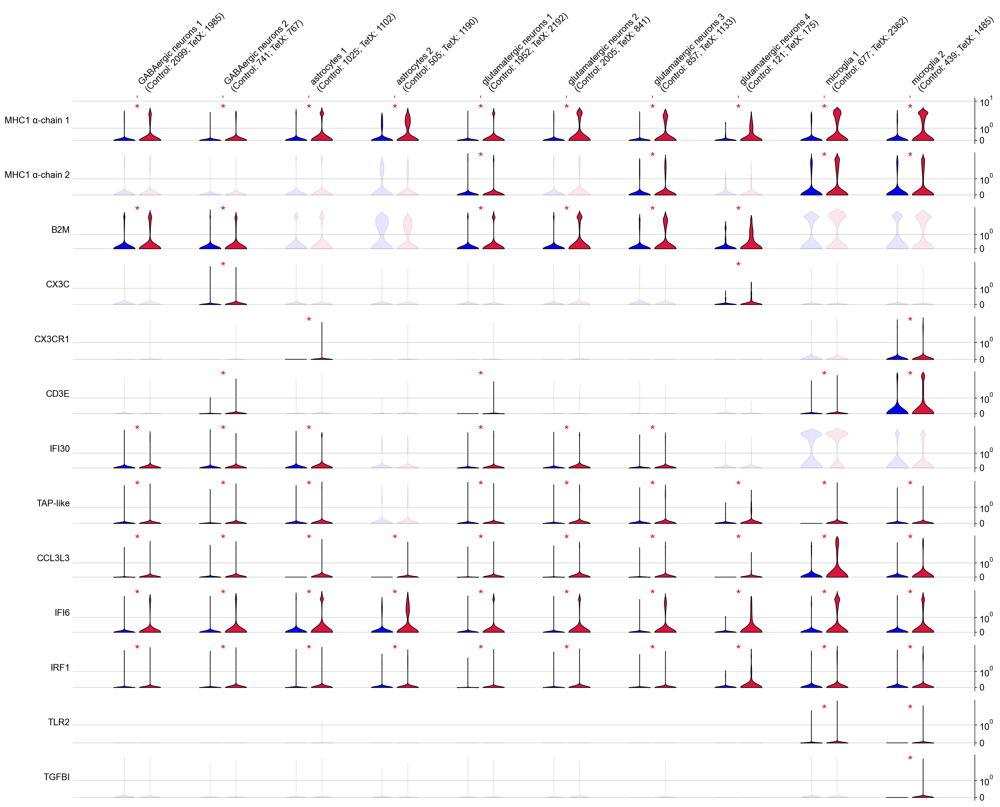

In [19]:
genes = markers2
labels = names2
celltypes = [
    "GABAergic neurons 1",
    "GABAergic neurons 2",
    "astrocytes 1",
    "astrocytes 2",
    "glutamatergic neurons 1",
    "glutamatergic neurons 2",
    "glutamatergic neurons 3",
    "glutamatergic neurons 4",
    "microglia 1",
    "microglia 2",
]

violinplot(
    adata_exp,
    adata_ctrl,
    genes,
    labels,
    celltypes,
    "MHC1_microglia_activation",
    fold_change_min=2,
    figsize=(25, 20),
)

#### Notes on MHC1 associated genes listed above:
##### CCL3L3
Pro-inflammatory (found in DE genes analysis)

##### IFI6
Pro-inflammatory (found in DE genes analysis)

##### IRF1
Transcription factor involved in microglia activation (Masuda et al JPS 2015)

##### TLR2
From Masuda et al JPS 2015

##### MHC1 1
novel gene (Zebra finch Gene)
ENSTGUG00000017273 RRCB01000109.1:1545781-1566436:1
Class I histocompatibility antigen, F10 alpha chain-like [Source:NCBI gene;Acc:115493126]
LOC100231469 (NCBI gene (formerly Entrezgene) record; description: class I histocompatibility antigen, F10 alpha chain-like,) is an external reference matched to Gene ENSTGUG00000017273

##### MHC1 2
novel gene (Zebra finch Gene)
ENSTGUG00000028417 RRCB01000109.1:254090-279387:1
Class I histocompatibility antigen, F10 alpha chain-like [Source:NCBI gene;Acc:115493083]
LOC115493083 (NCBI gene (formerly Entrezgene) record; description: class I histocompatibility antigen, F10 alpha chain-like,) is an external reference matched to Gene ENSTGUG00000028417

##### B2M
novel gene (Zebra finch Gene)
ENSTGUG00000004607 10:4098707-4102774:-1
GO:0042612 (GO record; description: MHC class I protein complex,) is an external reference matched to Transcript ENSTGUT00000004794  
-- UniProtKB match:Beta-2-microglobulin

##### CX3C

##### CX3CR1


##### CD3E
ENSTGUG00000022317 24:6524361-6530450:-1
CD3e molecule [Source:NCBI gene;Acc:115498349].

##### IFI30
ENSTGUG00000000388 28:3544686-3547884:1
IFI30 lysosomal thiol reductase [Source:HGNC Symbol;Acc:HGNC:5398]
GO:0042590 (GO record; description: antigen processing and presentation of exogenous peptide antigen via MHC class I,) is an external reference matched to Transcript ENSTGUT00000000403

##### TAP-like
novel gene (Zebra finch Gene)
ENSTGUG00000015337 RRCB01000090.1:2677018-2687645:1
Antigen peptide transporter 1-like [Source:NCBI gene;Acc:105760759]
GO:0002479 (GO record; description: antigen processing and presentation of exogenous peptide antigen via MHC class I, TAP-dependent,) is an external reference matched to Transcript ENSTGUT00000015946

TAP1 is required as transporter for loading peptides onto MHC class I molecules before their transport to the cell surface (Van Kaer et al., 1992)